In [212]:
%matplotlib widget
%load_ext autoreload
%autoreload 2

from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error
from matplotlib.collections import LineCollection
import matplotlib.patches as patches
from geopy.distance import geodesic

from IS2ML_utils import *

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [213]:
plt.close('all')
fns = {
    1: 'sonar/data_lutz/Sonar_2022-07-09_lake522.shp',
    2: 'sonar/data_lutz/Sonar_2022-07-04_lake610a.shp',
    3: 'sonar/data_lutz/Sonar_2022-07-09_lake610b.shp'
}
crs_out = 'EPSG:3413'
tformat_in = '%Y-%m-%d %H:%M:%SZ'
tformat_out = '%Y-%m-%dT%H:%M:%SZ'
tformat_print = '%a, %-d %b %Y, %-I:%M %p'

# for iax, file in enumerate(list(fns.keys())):

#     fn = fns[file]
#     gdf = gpd.read_file(fn)
#     # gdf['timestamp'] = gdf.apply(lambda x: datetime.timestamp(datetime.strptime(x.Time, tformat_in)), axis=1)
#     gdf['timestamp'] = gdf['Time'].apply(lambda x: datetime.strptime(x, tformat_in).replace(tzinfo=timezone.utc).timestamp())
#     gdf[['lon', 'lat']] = gdf.geometry.get_coordinates()
#     gdf['xatc'] = 0.0
#     for i in np.arange(1,len(gdf)):
#         gdf.at[i,'xatc'] = gdf.at[i-1,'xatc'] + geodesic(gdf[['lon', 'lat']].iloc[i], gdf[['lon', 'lat']].iloc[i-1]).meters

#     date_time_sonar = datetime.strftime(datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc), tformat_out)
#     print('\n%s' % fn)
#     gdf_sonar = get_S2_along_sonar(gdf, fn=fn, days_buffer=7, min_sun_elevation=20, max_cloudiness=20, 
#                                    limit_n_imgs=20, ground_track_buffer=5.0)
    

In [214]:
# compile all data together
base_dir = 'sonar/sonar_S2_CSVs'

if base_dir[-1] != '/':
    base_dir += '/'
    
searchdir = base_dir
searchfor = '_lakeinfo.csv'
filelist_info = [searchdir+f for f in os.listdir(searchdir) \
            if os.path.isfile(os.path.join(searchdir, f)) & (searchfor in f)]
filelist_info.sort()
listlength_info = len(filelist_info)
print('number *_lakeinfo.csv:', listlength_info)

searchfor = '.csv'
exclude = '_lakeinfo.csv'
filelist = [searchdir+f for f in os.listdir(searchdir) \
            if os.path.isfile(os.path.join(searchdir, f)) & (searchfor in f) & (exclude not in f)]
filelist.sort()
listlength = len(filelist)
print('number *.csv:', listlength)

number *_lakeinfo.csv: 0
number *.csv: 3


In [215]:
dfs = []
print('\n\ncompiling data')
for ifn, fn in enumerate(filelist):
    print('%5i / %5i' % (ifn+1, listlength), end='\r')
    dfs.append(pd.read_csv(fn))
df_data = pd.concat(dfs).reset_index(drop=True)

print('\n\n --> done.')



compiling data
    3 /     3

 --> done.


In [216]:
df_saveinfo = pd.DataFrame({'IS2_id': np.unique(df_data.IS2_id)})
def get_time_sonar(r):
    thisfn = 'sonar/data_lutz/' + r.IS2_id.replace('lutz_Sonar', 'Sonar') + '.shp'
    gdf = gpd.read_file(thisfn)
    gdf['timestamp'] = gdf['Time'].apply(lambda x: datetime.strptime(x, tformat_in).replace(tzinfo=timezone.utc).timestamp())
    date_time_sonar = datetime.strftime(datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc), tformat_out)
    return date_time_sonar
df_saveinfo['time_sonar'] = df_saveinfo.apply(get_time_sonar, axis=1)

# Ignore specific warnings
import scipy
warnings.filterwarnings("ignore", category=scipy.stats.ConstantInputWarning)
warnings.filterwarnings("ignore", category=RuntimeWarning, message="divide by zero encountered in log")
warnings.filterwarnings("ignore", message="All-NaN slice encountered")

df_save = df_data.copy()

# drop unnecessary elevation info from IS2
df_save = df_save.drop(columns=['h_fit_surf', 'h_fit_bed'])

# remove nan data 
print('dropping %d missing values' % df_save.isna().any(axis=1).sum())
df_save = df_save[~df_save.isna().any(axis=1)].reset_index(drop=True)

# cast surface classification to uint8
df_save.SCL = np.round(df_save.SCL).astype(np.uint8)

# filter out confidence values lower than 0.05 so nobody grossly abuses data that can't be trusted
conf_thresh = 0.05
df_save = df_save[df_save.conf > conf_thresh]

def norma(x):
    xn = x - np.nanmin(x)
    return xn / np.nanmax(xn)

def check_finite(arr1, arr2):
    return ~(np.isinf(arr1) | np.isnan(arr1) | np.isinf(arr2) | np.isnan(arr2))

def get_matching_stats(col, ndwi_thresh=0.125, min_valid_values=10, conf_thresh=conf_thresh):

    min_fin = min_valid_values
    
    ndwi_match = (col.depth > 0) == (col.ndwi > ndwi_thresh)
    fin = check_finite(col.depth, col.ndwi)
    mat = ndwi_match & fin
    ndwi_match_perc = 0.0 if (np.sum(mat) < min_fin) else ndwi_match.mean() * 100

    ndwi_match_depth = (col.depth > 0) & (col.ndwi > ndwi_thresh)
    is_depth = col.depth > 0
    fin = check_finite(col.depth, col.ndwi)
    mat = ndwi_match_depth & fin
    ndwi_match_perc_depth = 0.0 if (np.sum(mat) < min_fin) else ndwi_match_depth.sum() / is_depth.sum() * 100
    
    ndwi_match_norm = (col.depth > 0) == (norma(col.ndwi) > ndwi_thresh)
    fin = check_finite(col.depth, norma(col.ndwi))
    mat = ndwi_match & fin
    ndwi_match_perc_norm = 0.0 if (np.sum(mat) < min_fin) else ndwi_match_norm.mean() * 100

    ndwi_match_perc_max = np.nanmax((ndwi_match_perc, ndwi_match_perc_norm, 0.0))

    ndwi_match = ndwi_match_depth & (col.conf >= conf_thresh) # use only values where ICESat-2 sees a water depth
    bg_avg = norma(np.mean(np.vstack((norma(np.log(col.B2)), norma(np.log(col.B3)))), axis=0))
    fin = check_finite(col.depth, bg_avg)
    mat = ndwi_match & fin
    Rsquared_log_B2B3 = -1.0 if (np.sum(fin) < min_fin) else pearsonr(-col.depth[fin], bg_avg[fin]).statistic
    Rsquared_log_B2B3_match = -1.0 if (np.sum(mat) < min_fin) else pearsonr(-col.depth[mat], bg_avg[mat]).statistic
    fin = check_finite(col.depth, np.log(col.B2))
    mat = ndwi_match & fin
    Rsquared_log_B2 = -1.0 if (np.sum(fin) < min_fin) else pearsonr(-col.depth[fin], np.log(col.B2)[fin]).statistic
    Rsquared_log_B2_match = -1.0 if (np.sum(mat) < min_fin) else pearsonr(-col.depth[mat], np.log(col.B2)[mat]).statistic
    fin = check_finite(col.depth, np.log(col.B3))
    mat = ndwi_match & fin
    Rsquared_log_B3 = -1.0 if (np.sum(fin) < min_fin) else pearsonr(-col.depth[fin], np.log(col.B3)[fin]).statistic
    Rsquared_log_B3_match = -1.0 if (np.sum(mat) < min_fin) else pearsonr(-col.depth[mat], np.log(col.B3)[mat]).statistic
    fin = check_finite(col.depth, np.log(col.B4))
    mat = ndwi_match & fin
    Rsquared_log_B4 = -1.0 if (np.sum(fin) < min_fin) else pearsonr(-col.depth[fin], np.log(col.B4)[fin]).statistic
    Rsquared_log_B4_match = -1.0 if (np.sum(mat) < min_fin) else pearsonr(-col.depth[mat], np.log(col.B4)[mat]).statistic
    Rsquared_max_full = np.nanmax((Rsquared_log_B2, Rsquared_log_B3, Rsquared_log_B4, Rsquared_log_B2B3, -1.0))
    Rsquared_max_match = np.nanmax((Rsquared_log_B2_match, Rsquared_log_B3_match, Rsquared_log_B4_match, Rsquared_log_B2B3_match, -1.0))
    Rsquared_max = np.nanmax((Rsquared_max_full, Rsquared_max_match, -1.0))

    return pd.Series({
        'ndwi_thresh': ndwi_thresh,
        'ndwi_match_perc': ndwi_match_perc,
        'ndwi_match_perc_norm': ndwi_match_perc_norm,
        'ndwi_match_perc_depth': ndwi_match_perc_depth,
        'ndwi_match_perc_max': ndwi_match_perc_max,
        'Rsquared_log_B2B3': Rsquared_log_B2B3,
        'Rsquared_log_B2B3_match': Rsquared_log_B2B3_match,
        'Rsquared_log_B2': Rsquared_log_B2,
        'Rsquared_log_B2_match': Rsquared_log_B2_match,
        'Rsquared_log_B3': Rsquared_log_B3,
        'Rsquared_log_B3_match': Rsquared_log_B3_match,
        'Rsquared_log_B4': Rsquared_log_B4,
        'Rsquared_log_B4_match': Rsquared_log_B4_match,
        'Rsquared_max_full': Rsquared_max_full,
        'Rsquared_max_match': Rsquared_max_match,
        'Rsquared_max': Rsquared_max,
    })

is2groups = df_save.groupby('IS2_id')
df_info_new = is2groups.apply(get_matching_stats)
df_saveinfo = df_saveinfo.set_index('IS2_id').join(df_info_new)

is_zero_depth = is2groups['depth'].max() == 0.0
not_zero_depth_indices = is_zero_depth[~is_zero_depth].index
not_zero_depth = df_save.apply(lambda x: x.IS2_id in not_zero_depth_indices, axis=1)
df_save = df_save[not_zero_depth].reset_index(drop=True)

# remove any info for lake segments that have been fully removed (just in case)
is2ids = np.unique(df_save.IS2_id)
is_in_data = df_saveinfo.apply(lambda x: x.name in is2ids, axis=1)
df_saveinfo = df_saveinfo[is_in_data]

# sort by estimated ICESat-2 quality
df_save['depth_quality_sort'] = 0.0
df_save = df_save.sort_values(by=['depth_quality_sort', 'IS2_id', 'xatc'], ascending=[False, True, True])

df_saveinfo = df_saveinfo[[
    'time_sonar',
    'ndwi_thresh',
    'ndwi_match_perc',
    'ndwi_match_perc_norm',
    'ndwi_match_perc_depth',
    'ndwi_match_perc_max',
    'Rsquared_log_B2B3',
    'Rsquared_log_B2B3_match',
    'Rsquared_log_B2',
    'Rsquared_log_B2_match',
    'Rsquared_log_B3',
    'Rsquared_log_B3_match',
    'Rsquared_log_B4',
    'Rsquared_log_B4_match',
    'Rsquared_max_full',
    'Rsquared_max_match',
    'Rsquared_max'
]]

df_save = df_save.drop(columns=['depth_quality_sort']).reset_index(drop=True)

# fix the first part that's off in lake 610a
df_save[(df_save.xatc < 102) & (df_save.IS2_id == 'lutz_Sonar_2022-07-04_lake610a')] = 0.0
df_save = df_save[df_save.depth > 0.0].reset_index(drop=True)
df_save.xatc -= df_save.xatc.min()

dropping 0 missing values


In [217]:
fn_out_info = 'sonar/S2_predictors/sonar_segment_properties.csv'
fn_out_data = 'sonar/S2_predictors/sonar_segments_depth_reflectance_S2.csv'

import pyarrow as pa
fn_out_data_pq = fn_out_data.replace('.csv', '.parquet')
SCHEMA = pa.schema([
    ('lat', pa.float32()),
    ('lon', pa.float32()),
    ('xatc', pa.float32()),
    ('depth', pa.float32()),
    ('conf', pa.float32()),
    ('B1', pa.float32()),
    ('B2', pa.float32()),
    ('B3', pa.float32()),
    ('B4', pa.float32()),
    ('B5', pa.float32()),
    ('B6', pa.float32()),
    ('B7', pa.float32()),
    ('B8', pa.float32()),
    ('B8A', pa.float32()),
    ('B9', pa.float32()),
    ('B11', pa.float32()),
    ('B12', pa.float32()),
    ('AOT', pa.float32()),
    ('WVP', pa.float32()),
    ('SCL', pa.uint8()),
    ('MSK_CLDPRB', pa.float32()),
    ('MSK_SNWPRB', pa.float32()),
    ('cloudScore', pa.float32()),
    ('ndwi', pa.float32()),
    ('SZA', pa.float32()),
    ('SAA', pa.float32()),
    ('VZA_B1', pa.float32()),
    ('VZA_B2', pa.float32()),
    ('VZA_B3', pa.float32()),
    ('VZA_B4', pa.float32()),
    ('VZA_B5', pa.float32()),
    ('VZA_B6', pa.float32()),
    ('VZA_B7', pa.float32()),
    ('VZA_B8', pa.float32()),
    ('VZA_B8A', pa.float32()),
    ('VZA_B9', pa.float32()),
    ('VZA_B11', pa.float32()),
    ('VZA_B12', pa.float32()),
    ('VAA_B1', pa.float32()),
    ('VAA_B2', pa.float32()),
    ('VAA_B3', pa.float32()),
    ('VAA_B4', pa.float32()),
    ('VAA_B5', pa.float32()),
    ('VAA_B6', pa.float32()),
    ('VAA_B7', pa.float32()),
    ('VAA_B8', pa.float32()),
    ('VAA_B8A', pa.float32()),
    ('VAA_B9', pa.float32()),
    ('VAA_B11', pa.float32()),
    ('VAA_B12', pa.float32()),
    ('tdiff_sec', pa.uint32()),
    ('plot_id', pa.uint16()),
    ('S2_id', pa.string()),
    ('IS2_id', pa.string()),
])
df_save.to_parquet(fn_out_data_pq, schema=SCHEMA)
print('\n--> saved file as %s' % fn_out_data_pq)

fn_out_info_pq = fn_out_info.replace('.csv', '.parquet')
df_saveinfo.to_parquet(fn_out_info_pq)
print('\n--> saved file as %s' % fn_out_info_pq)

df_saveinfo.to_csv(fn_out_info)
print('\n--> saved file as %s' % fn_out_info)
df_save.to_csv(fn_out_data, index=False)
print('\n--> saved file as %s' % fn_out_data)


--> saved file as sonar/S2_predictors/sonar_segments_depth_reflectance_S2.parquet

--> saved file as sonar/S2_predictors/sonar_segment_properties.parquet

--> saved file as sonar/S2_predictors/sonar_segment_properties.csv

--> saved file as sonar/S2_predictors/sonar_segments_depth_reflectance_S2.csv


In [218]:
fn_info = 'sonar/S2_predictors/sonar_segment_properties.parquet'
fn_data = 'sonar/S2_predictors/sonar_segments_depth_reflectance_S2.parquet'
df_info = pd.read_parquet(fn_info)
df_data = pd.read_parquet(fn_data)

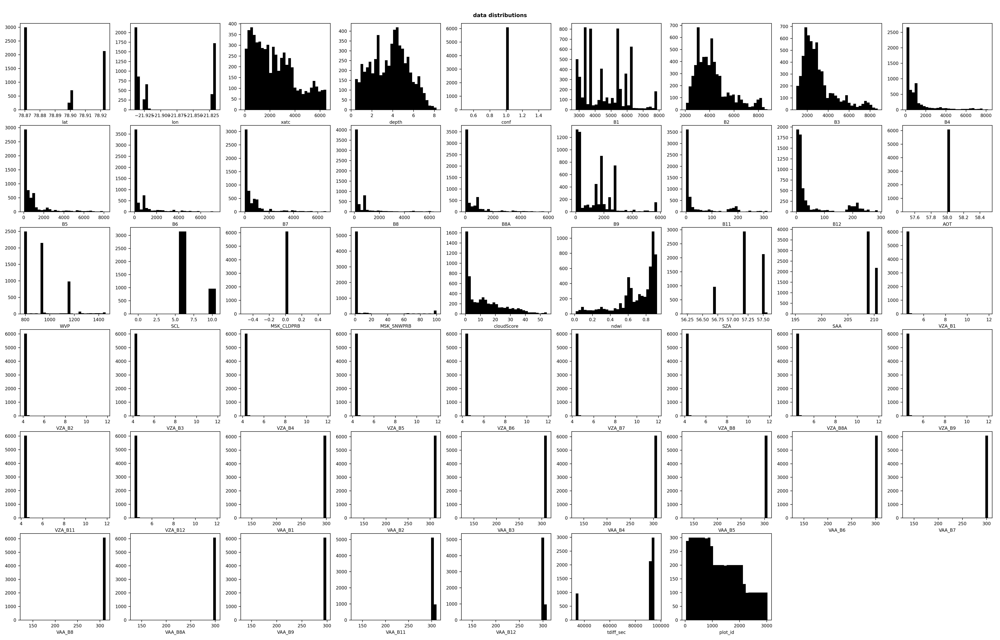

In [219]:
plt.close('all')
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=['black'])

fig, axs = plt.subplots(nrows=6, ncols=9, figsize=[25,16], dpi=35)
axs = axs.flatten()

for i, k in enumerate(list(df_data)[:-2]):
    ax = axs[i]
    bins = np.arange(-0.5, 11.5) if k == 'SCL' else 30
    ax.hist(df_data[k], bins=bins)
    ax.set_xlabel(k)

while i < (len(axs)-1):
    i+=1
    ax = axs[i]
    ax.axis('off')

supt = 'data distributions'
fig.suptitle(supt + '\n', fontweight='bold')

fig.tight_layout(h_pad=0, w_pad=0)
figfn = 'plots/data_distributions_sonar.jpg'
fig.savefig(figfn, dpi=300)
plt.close(fig)
display(Image(figfn))

In [220]:
df_in = df_data[['IS2_id', 'lat', 'lon', 'xatc', 'conf', 'depth']].copy()
for i, k in enumerate(list(df_data)[:-2]):

    # log transforms of bands
    if k.startswith('B') or (k=='AOT') or (k=='WVP') or (k=='cloudScore'):
        newname = k+'_log'
        print('%s --> log: %s' % (k, newname))
        log_trans = np.log1p(df_data[k])
        df_in[newname] = log_trans

    # cosines of zenith angles
    if (k=='SZA') or k.startswith('VZA'):
        newname = k+'_cos'
        print('%s --> cos: %s' % (k, newname))
        df_in[newname] = np.cos(np.deg2rad(df_data[k]))
        
    # the features that stay the same
    if k in ['SCL', 'MSK_CLDPRB', 'MSK_SNWPRB', 'ndwi']:
        print('%s --> no change: %s' % (k, k))
        df_in[k] = df_data[k]

    # cosines of relative azimuth angles, and phase angles
    if k.startswith('VAA'):
        bnd = k[4:]
        newname = 'RAA_' + bnd + '_cos'
        print('%s --> cos relative azimuth: %s' % (k, newname))
        RAA = np.cos(np.deg2rad(df_data[k] - df_data.SAA))
        df_in[newname] = RAA
        newname = 'PhA_' + bnd
        print('%s --> phase angle: %s' % (k, newname))
        PhA = np.arccos(np.cos(np.deg2rad(df_data.SZA)) * np.cos(np.deg2rad(df_data['VZA_'+bnd])) + np.sin(np.deg2rad(df_data.SZA)) * np.sin(np.deg2rad(df_data['VZA_'+bnd])) * RAA)
        df_in[newname] = PhA

# visible bands ratios and differences
df_in['ratio_logB4_logB2'] = (df_in.B4_log+1.0) / (df_in.B2_log+1.0)
df_in['ratio_logB4_logB3'] = (df_in.B4_log+1.0) / (df_in.B3_log+1.0)
df_in['ratio_logB3_logB2'] = (df_in.B3_log+1.0) / (df_in.B2_log+1.0)
df_in['diff_logB2_logB4'] = df_in.B2_log - df_in.B4_log
df_in['diff_logB3_logB4'] = df_in.B3_log - df_in.B4_log
df_in['diff_logB2_logB3'] = df_in.B2_log - df_in.B3_log

fn_features = 'sonar/sonar_segments_depth_features.parquet'
df_in.to_parquet(fn_features)
print('\n --> wrote file: %s' % fn_features)
        
df_in

B1 --> log: B1_log
B2 --> log: B2_log
B3 --> log: B3_log
B4 --> log: B4_log
B5 --> log: B5_log
B6 --> log: B6_log
B7 --> log: B7_log
B8 --> log: B8_log
B8A --> log: B8A_log
B9 --> log: B9_log
B11 --> log: B11_log
B12 --> log: B12_log
AOT --> log: AOT_log
WVP --> log: WVP_log
SCL --> no change: SCL
MSK_CLDPRB --> no change: MSK_CLDPRB
MSK_SNWPRB --> no change: MSK_SNWPRB
cloudScore --> log: cloudScore_log
ndwi --> no change: ndwi
SZA --> cos: SZA_cos
VZA_B1 --> cos: VZA_B1_cos
VZA_B2 --> cos: VZA_B2_cos
VZA_B3 --> cos: VZA_B3_cos
VZA_B4 --> cos: VZA_B4_cos
VZA_B5 --> cos: VZA_B5_cos
VZA_B6 --> cos: VZA_B6_cos
VZA_B7 --> cos: VZA_B7_cos
VZA_B8 --> cos: VZA_B8_cos
VZA_B8A --> cos: VZA_B8A_cos
VZA_B9 --> cos: VZA_B9_cos
VZA_B11 --> cos: VZA_B11_cos
VZA_B12 --> cos: VZA_B12_cos
VAA_B1 --> cos relative azimuth: RAA_B1_cos
VAA_B1 --> phase angle: PhA_B1
VAA_B2 --> cos relative azimuth: RAA_B2_cos
VAA_B2 --> phase angle: PhA_B2
VAA_B3 --> cos relative azimuth: RAA_B3_cos
VAA_B3 --> phase angle

,IS2_id,lat,lon,xatc,conf,depth,B1_log,B2_log,B3_log,B4_log,...,RAA_B11_cos,PhA_B11,RAA_B12_cos,PhA_B12,ratio_logB4_logB2,ratio_logB4_logB3,ratio_logB3_logB2,diff_logB2_logB4,diff_logB3_logB4,diff_logB2_logB3
0,lutz_Sonar_2022-07-04_lake610a,78.900208,-21.919163,23.911629,1.0,0.46,8.949625,9.010417,8.956762,8.822649,...,-0.183233,1.004898,-0.136428,1.001793,0.981243,0.986530,0.994640,0.187768,0.134113,0.053655
1,lutz_Sonar_2022-07-04_lake610a,78.900208,-21.919189,26.905758,1.0,0.51,8.939928,9.004310,8.948985,8.804421,...,-0.183314,1.004904,-0.136528,1.001800,0.980020,0.985470,0.994470,0.199888,0.144564,0.055325
2,lutz_Sonar_2022-07-04_lake610a,78.900215,-21.919216,29.905252,1.0,0.57,8.928300,8.996537,8.940370,8.784204,...,-0.183400,1.004910,-0.136634,1.001808,0.978759,0.984290,0.994381,0.212333,0.156165,0.056168
3,lutz_Sonar_2022-07-04_lake610a,78.900215,-21.919243,32.904743,1.0,0.60,8.915046,8.987900,8.930312,8.760218,...,-0.183485,1.004916,-0.136739,1.001816,0.977204,0.982871,0.994234,0.227682,0.170094,0.057588
4,lutz_Sonar_2022-07-04_lake610a,78.900215,-21.919270,35.904240,1.0,0.85,8.900196,8.978354,8.918927,8.732712,...,-0.183571,1.004923,-0.136845,1.001824,0.975382,0.981226,0.994044,0.245643,0.186215,0.059427
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6077,lutz_Sonar_2022-07-09_lake610b,78.870651,-21.934702,6480.853027,1.0,0.43,8.971703,9.042000,9.063102,9.001351,...,-0.070997,1.005401,-0.004241,1.000322,0.995952,0.993864,1.002101,0.040648,0.061750,-0.021102
6078,lutz_Sonar_2022-07-09_lake610b,78.870651,-21.934673,6483.847168,1.0,0.43,8.971703,9.048346,9.064959,9.001975,...,-0.071007,1.005402,-0.004253,1.000323,0.995385,0.993742,1.001653,0.046371,0.062984,-0.016613
6079,lutz_Sonar_2022-07-09_lake610b,78.870651,-21.934647,6486.841309,1.0,0.43,8.971703,9.055170,9.066846,9.002460,...,-0.071017,1.005403,-0.004266,1.000324,0.994758,0.993604,1.001161,0.052711,0.064386,-0.011676
6080,lutz_Sonar_2022-07-09_lake610b,78.870651,-21.934629,6488.869629,1.0,0.43,8.971703,9.064808,9.070873,9.006955,...,-0.071047,1.005405,-0.004302,1.000327,0.994252,0.993653,1.000603,0.057853,0.063918,-0.006065


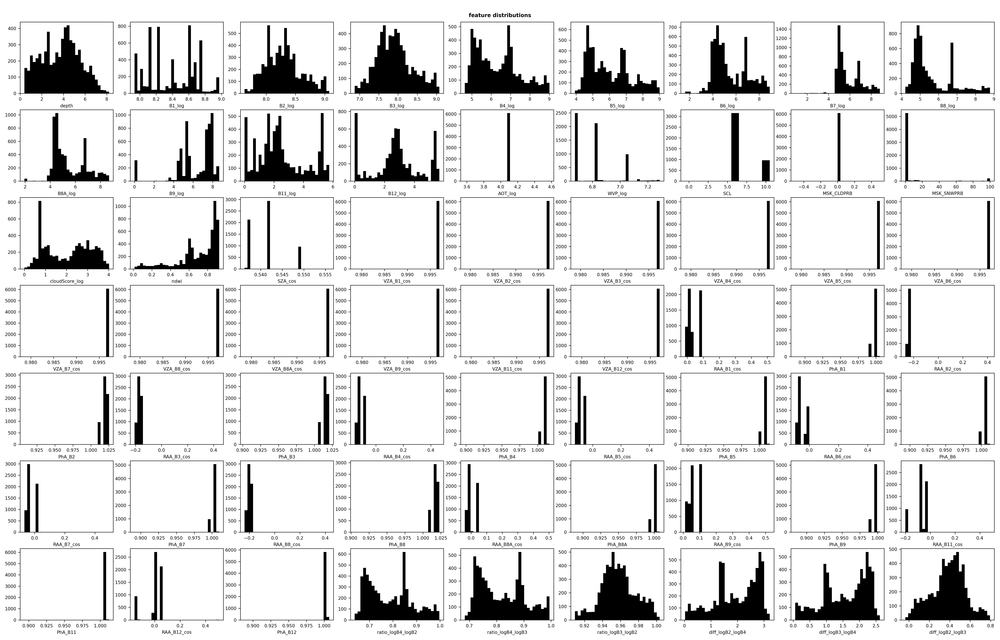

In [221]:
plt.close('all')
plt.rcParams['axes.prop_cycle'] = plt.cycler(color=['black'])

fig, axs = plt.subplots(nrows=7, ncols=9, figsize=[25,16], dpi=35)
axs = axs.flatten()

for i, k in enumerate(list(df_in)[5:]):
    ax = axs[i]
    bins = np.arange(-0.5, 11.5) if k == 'SCL' else 30
    ax.hist(df_in[k], bins=bins)
    ax.set_xlabel(k)

while i < (len(axs)-1):
    i+=1
    ax = axs[i]
    ax.axis('off')

supt = 'feature distributions'
fig.suptitle(supt + '\n', fontweight='bold')

fig.tight_layout(h_pad=0, w_pad=0)
figfn = 'plots/feature_distributions_sonar.jpg'
fig.savefig(figfn, dpi=300)
plt.close(fig)
display(Image(figfn))

# get the full images

-21.81816720998355 78.922714643655 2022-07-09T17:02:18Z 276.4800662412308
Looking for Sentinel-2 images from 2022-07-07T17:02:18 to 2022-07-11T17:02:18 --> there are 4 cloud-free images.
Looking for Sentinel-2 images from 2022-07-05T17:02:18 to 2022-07-13T17:02:18 --> there are 16 cloud-free images.
--> Closest cloud-free Sentinel-2 image:
    - product_id: S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_20220708T174327
    - time difference: -2 days, 15:27:55.757000
    - mean cloud probability: 0.1
--> Downloaded the 8-bit RGB image as sonar/data_lutz/Sonar_2022-07-09_lake522_imagery.tiff.
Looking for Sentinel-2 images from 2022-07-07T17:02:18 to 2022-07-11T17:02:18 --> there are 4 cloud-free images.
Looking for Sentinel-2 images from 2022-07-05T17:02:18 to 2022-07-13T17:02:18 --> there are 16 cloud-free images.
--> Closest cloud-free Sentinel-2 image:
    - product_id: S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_20220708T174327
    - time difference: -2 days, 15:27:55.757000
    - mea

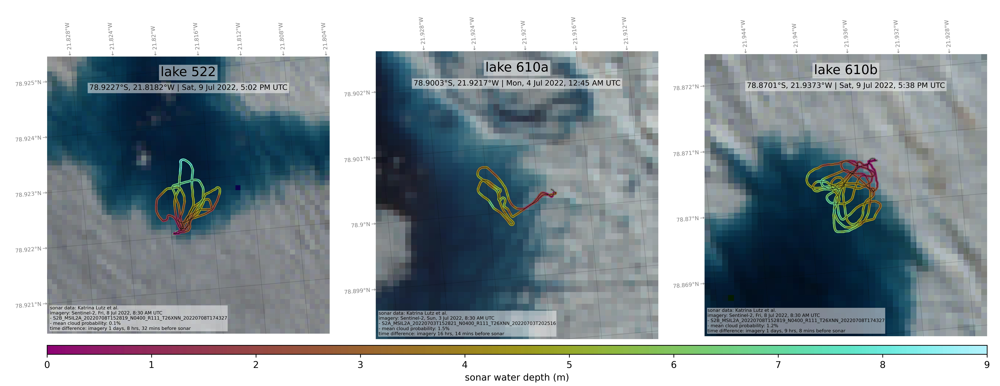

In [79]:
plt.close('all')
#from shapely.geometry import Point, Polygon, LineString, box
from shapely.geometry import box

re_download = True

fns = {
    1: 'sonar/data_lutz/Sonar_2022-07-09_lake522.shp',
    2: 'sonar/data_lutz/Sonar_2022-07-04_lake610a.shp',
    3: 'sonar/data_lutz/Sonar_2022-07-09_lake610b.shp'
}

vmin = 0
vmax = 9

buffers = {
    1: 1.5,
    2: 1.5,
    3: 1.5
}

gammas = {
    1: 1.2,
    2: 1.2,
    3: 1.2
}

clouds = {
    1: 50,
    2: 50,
    3: 50
}

crs_out = 'EPSG:3413'
tformat_in = '%Y-%m-%d %H:%M:%SZ'
tformat_out = '%Y-%m-%dT%H:%M:%SZ'
tformat_print = '%a, %-d %b %Y, %-I:%M %p'

# fig, axs = plt.subplots(figsize=[10,9], nrows=2, ncols=3)
# fig, axs = plt.subplots(figsize=[15,10], ncols=3, dpi=60)
fig = plt.figure(figsize=[15,5.8], dpi=60)
gs = fig.add_gridspec(ncols=3, nrows=1)
axs = [fig.add_subplot(gs[0,i]) for i in range(3)]

select_bands_full = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12', 'probability', 'AOT', 'WVP', 'SCL', 'MSK_CLDPRB', 'MSK_SNWPRB']
select_bands_rename = ['B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12', 'cloudScore', 'AOT', 'WVP', 'SCL', 'MSK_CLDPRB', 'MSK_SNWPRB']

for iax, file in enumerate(fns.keys()):

    fn = fns[file]
    ax = axs[iax]
    gdf = gpd.read_file(fn)
    gdf['timestamp'] = gdf.apply(lambda x: datetime.timestamp(datetime.strptime(x.Time, tformat_in)), axis=1)
    bbox_gdf = gpd.GeoDataFrame(geometry=[box(*gdf.total_bounds)], crs=gdf.crs, index=[0])
    bbox_gre = bbox_gdf.to_crs(crs_out)
    lonlat = bbox_gdf.geometry.get_coordinates()
    xy = bbox_gre.geometry.get_coordinates()
    buff = buffers[file] * np.max((xy.x.max() - xy.x.min(), xy.y.max() - xy.y.min()))
    bboxbuff = bbox_gre.buffer(buff)
    fn_bbox = fn.replace('sonar/data_lutz/','sonar/bbox_shapefiles/').replace('.shp', '_bbox_buff_%.0f.shp' % buff)
    bboxbuff.to_file(fn_bbox)
    lon_center = lonlat.x.min() + (lonlat.x.max() - lonlat.x.min())/2
    lat_center = lonlat.y.min() + (lonlat.y.max() - lonlat.y.min())/2
    date_time = datetime.strftime(datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc), tformat_out)
    fn_imgry = fn.replace('.shp', '_imagery.tiff')
    fn_imgry_full = fn.replace('.shp', '_imagery_full.tiff')
    print(lon_center, lat_center, date_time, buff)
    fn_imgprops = fn.replace('.shp', '_imgprops.csv')

    # download imagery if needed
    if re_download | (not (os.path.isfile(fn_imgry) and os.path.isfile(fn_imgprops))):
        imgprops = download_S2(lon_center, lat_center, date_time, buffer_m=buff, max_cloud_prob=clouds[file],
                           gamma_value=gammas[file], imagery_filename=fn_imgry, download_imagery=re_download)
        imgprops2 = download_S2_full(lon_center, lat_center, date_time, buffer_m=buff, max_cloud_prob=clouds[file],
                           gamma_value=gammas[file], imagery_filename=fn_imgry_full, download_imagery=re_download,
                           select_bands = select_bands_full, select_bands_rename=select_bands_rename)
        pd.Series(imgprops).to_csv(fn_imgprops, index=False)
    else:
        print('not downloading new imagery')
        imgprops = list(pd.read_csv(fn_imgprops)['0'])

    with rio.open(imgprops[0]) as myImage:
        rioplot.show(myImage, ax=ax)
        ax.axis('off')
        crs_img = myImage.crs
        
    gdf_img = gdf.to_crs(crs_img)
    add_graticule2(gdf=gdf_img, ax_img=ax, meridians_locs=['top'], parallels_locs=['left'], fontsz=6)
    gdf_plot = gdf_img.sort_values(by='Depth')
    gdf_plot[gdf_plot.Depth<0.2].plot(ax=ax, color='gray', markersize=7, edgecolors='none')
    gdf_plot[gdf_plot.Depth>=0.2].plot(ax=ax, column='Depth', cmap=cmc.hawaii, markersize=7, edgecolors='none', vmin=vmin, vmax=vmax)
    gdf_plot.plot(ax=ax, color='k', markersize=0.2, edgecolors='none')
    # sm = plt.cm.ScalarMappable(cmap=cmc.hawaii, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # sm._A = []
    # divider = make_axes_locatable(ax)
    # cax = divider.append_axes('right', size='3%', pad=0.05)
    # cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
    # cbar.set_label('sonar water depth (m)')
    
    lake_id = fn.split('_')[-1].replace('.shp','').replace('lake', 'lake ')
    datetime_plot = datetime.strftime(datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc), tformat_print)
    datetime_print_s2 = datetime.strftime(datetime.strptime(imgprops[1],tformat_out), tformat_print)
    lon_str = '%.4f°%s' % (np.abs(lon_center), 'W' if lon_center < 0 else 'E')
    lat_str = '%.4f°%s' % (np.abs(lat_center), 'S' if lon_center < 0 else 'N')

    # get the proper time difference
    t_s2 = datetime.strptime(imgprops[1], tformat_out).replace(tzinfo=timezone.utc)
    t_sonar = datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc)
    tdiff = t_s2 - t_sonar
    tsec = tdiff.total_seconds()
    sign = 'before' if np.sign(tsec) < 0 else 'after'
    tsec = np.abs(tsec) 
    days, rem = divmod(tsec, 24 * 60 * 60)
    hrs, rem = divmod(rem, 60 * 60)
    mins, secs = divmod(rem, 60)
    days = '' if days == 0 else '%i days, ' % days
    hrs = '' if hrs == 0 else '%i hrs, ' % hrs
    mins = '%i mins' % mins
    tdiff_str = 'imagery %s%s%s %s sonar' % (days,hrs,mins,sign)
    
    txt = '%s, %s | %s UTC' % (lat_str, lon_str, datetime_plot)
    tbbox = dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1.7)
    tbx = ax.text(0.5, 0.92, lake_id, transform=ax.transAxes, ha='center', va='bottom',fontsize=14)
    tbx.set_bbox(tbbox)
    tbx = ax.text(0.5, 0.9, txt, transform=ax.transAxes, ha='center', va='top',fontsize=8)
    tbx.set_bbox(tbbox)
    
    ## add some info about the Sentinel-2 image
    txt = 'sonar data: Katrina Lutz et al.'
    txt += '\nimagery: Sentinel-2, %s UTC\n' % datetime_print_s2
    txt += '- %s\n' % imgprops[4]
    txt += '- mean cloud probability: %.1f%%\n' % float(imgprops[3])
    txt += 'time difference: %s' % tdiff_str
    tbx = ax.text(0.01, 0.01, txt, transform=ax.transAxes, ha='left', va='bottom',fontsize=5)
    tbbox = dict(facecolor='white', alpha=0.5, edgecolor='none', pad=0.5)
    tbx.set_bbox(tbbox)

    print('\n%s' % lake_id)
    print('location: %.5f, %.5f' % (lon_center, lat_center))
    print('time:', datetime_plot)
    print('n_obs', len(gdf_plot[gdf_plot.Depth>0]))
    print('depth_max', gdf_plot.Depth.max())
    print('depth_min', gdf_plot.Depth.min())
    print('depth_min_nonzero %.2f\n' % gdf_plot[gdf_plot.Depth>0].Depth.min())

ax_full = fig.add_subplot(gs[0,:])
ax_full.axis('off')
cax = ax_full.inset_axes([0, 0.06, 1, 0.025])
sm = plt.cm.ScalarMappable(cmap=cmc.hawaii, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label('sonar water depth (m)')
# cbar.set_label('photon signal\nconfidence', fontsize=8, labelpad=1.5)
# cax.tick_params(axis='both', which='major', labelsize=7)

# axs[-1].axis('off')
fig.tight_layout()
figname = 'plots/supraglacial_lakes_sonar_depth_GrIS_NE.jpg'
fig.savefig(figname, dpi=600)
plt.close(fig)
display(Image(figname))

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error, mean_squared_error

import pickle
from sklearn.base import BaseEstimator, RegressorMixin

class MeanEnsembleRegressor(BaseEstimator, RegressorMixin):
    def __init__(self, regressors):
        self.regressors = regressors
    
    def fit(self, X, y):
        # Assume regressors are already fitted
        pass
    
    def predict(self, X):
        # Collect predictions from all regressors
        predictions = np.column_stack([regressor.predict(X) for regressor in self.regressors])
        # Return the mean of predictions
        return np.mean(predictions, axis=1)

with open('models/ensemble_regressor_test.pkl', 'rb') as f:
    loaded_ensemble_regressor = pickle.load(f)

In [143]:
fn_img.replace('/data_lutz/', '/img_depth_est/').replace('_imagery_full_info.tiff', '_depth_pred.tiff')

'sonar/img_depth_est/Sonar_2022-07-09_lake610b_depth_pred.tiff'

In [193]:
imgfns = [
    'sonar/data_lutz/Sonar_2022-07-09_lake522_imagery_full_info.tiff',
    'sonar/data_lutz/Sonar_2022-07-04_lake610a_imagery_full_info.tiff',
    'sonar/data_lutz/Sonar_2022-07-09_lake610b_imagery_full_info.tiff'
]

new_fns = []

for fn_img in imgfns:
    print('\n%s' % img_fn)
    out_fn_id = fn_img.split('/')[-1].replace('.tiff', '')
    fn_data = save_S2_bands_to_df(fn_img=fn_img, out_id=out_fn_id)
    df_data = pd.read_parquet(fn_data)
    fn_features = get_features_image(df_data, out_id=out_fn_id)
    df_feat = pd.read_parquet(fn_features).reset_index(drop=True)

    # predict the depth
    pred_feat = df_feat.iloc[:, 6:].copy()
    depth_pred = loaded_ensemble_regressor.predict(pred_feat)
    depth_pred[pred_feat.ndwi < 0.12] = 0.0
    pred_arr= np.empty((df_feat.row.max() + 1, df_feat.col.max() + 1))
    pred_arr[:] = np.nan
    pred_arr[df_feat['row'], df_feat['col']] = depth_pred

    new_fn_img = fn_img.replace('/data_lutz/', '/img_depth_est/').replace('_imagery_full_info.tiff', '_depth_pred.tiff')
    with rio.open(fn_img) as src:
        metadata = src.meta.copy()
        original_data = src.read()
        metadata.update(count=metadata['count'] + 1)
        with rio.open(new_fn_img, 'w', **metadata) as dst:
            dst.update_tags(0, product_id=src.tags(0)['product_id'])
            dst.update_tags(0, granule_id=src.tags(0)['granule_id'])
            for i in range(1, src.count + 1):
                dst.write(original_data[i-1], i)
                dst.update_tags(i, band_name=src.tags(i)['band_name'])
            dst.write(pred_arr, src.count + 1)
            dst.update_tags(src.count + 1, band_name='depth_meters')

    new_fns.append(new_fn_img)

print('saved files:')
print(new_fns)


sonar/data_lutz/Sonar_2022-07-09_lake610b_imagery_full_info.tiff
--> get metadata from S3 
downloading S2_MTD/S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_20220708T174327_MTD_TL.xml
--> interpolate angles 
--> saved file as sonar/S2_predictors/Sonar_2022-07-09_lake522_imagery_full_info_depth_reflectance_S2.parquet
--> wrote file: sonar/sonar_imagery_depth_features_Sonar_2022-07-09_lake522_imagery_full_info.parquet

sonar/data_lutz/Sonar_2022-07-09_lake610b_imagery_full_info.tiff
--> get metadata from S3 
downloading S2_MTD/S2A_MSIL2A_20220703T152821_N0400_R111_T26XNN_20220703T202516_MTD_TL.xml
--> interpolate angles 
--> saved file as sonar/S2_predictors/Sonar_2022-07-04_lake610a_imagery_full_info_depth_reflectance_S2.parquet
--> wrote file: sonar/sonar_imagery_depth_features_Sonar_2022-07-04_lake610a_imagery_full_info.parquet

sonar/data_lutz/Sonar_2022-07-09_lake610b_imagery_full_info.tiff
--> get metadata from S3 
downloading S2_MTD/S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2022

In [180]:
depth_pred
# Create an empty array
reshaped_array = np.empty((df_feat.row.max() + 1, df_feat.col.max() + 1))
reshaped_array[:] = np.nan
reshaped_array[df_feat['row'], df_feat['col']] = depth_pred


In [182]:
reshaped_array

array([[0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
        0.        ],
       ...,
       [5.3042549 , 6.91459093, 7.87154677, ..., 0.        , 0.        ,
        0.        ],
       [5.23277016, 6.39499492, 8.54177237, ..., 0.        , 0.        ,
        0.        ],
       [5.34018843, 6.63217924, 8.48204093, ..., 0.        , 0.        ,
        0.        ]])

In [176]:
df_feat

,IS2_id,lat,lon,col,row,conf,B1_log,B2_log,B3_log,B4_log,...,RAA_B11_cos,PhA_B11,RAA_B12_cos,PhA_B12,ratio_logB4_logB2,ratio_logB4_logB3,ratio_logB3_logB2,diff_logB2_logB4,diff_logB3_logB4,diff_logB2_logB3
0,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.872437,-21.947046,0,0,0.0,8.955061,8.815964,8.852093,8.780941,...,-0.079895,1.006060,-0.015303,1.001203,0.996432,0.992778,1.003681,0.035023,0.071152,-0.036129
1,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.872429,-21.946583,1,0,0.0,8.957253,8.746557,8.707648,8.690978,...,-0.080025,1.006070,-0.015460,1.001215,0.994298,0.998283,0.996008,0.055579,0.016670,0.038909
2,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.872421,-21.946121,2,0,0.0,8.959569,8.893023,8.888618,8.840580,...,-0.080154,1.006080,-0.015615,1.001226,0.994699,0.995142,0.999555,0.052444,0.048038,0.004405
3,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.872414,-21.945660,3,0,0.0,8.961879,9.220786,9.143453,9.103312,...,-0.080281,1.006090,-0.015768,1.001238,0.988506,0.996043,0.992434,0.117475,0.040141,0.077333
4,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.872406,-21.945196,4,0,0.0,8.964056,9.157888,9.215228,9.135725,...,-0.080407,1.006100,-0.015920,1.001249,0.997818,0.992217,1.005645,0.022163,0.079503,-0.057340
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2299,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.867912,-21.929058,43,47,0.0,9.019906,8.996281,9.006142,8.927580,...,-0.059737,1.004573,0.009694,0.999225,0.993127,0.992149,1.000986,0.068701,0.078562,-0.009861
2300,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.867905,-21.928596,44,47,0.0,9.019180,8.957897,8.913685,8.798001,...,-0.059899,1.004585,0.009499,0.999240,0.983943,0.988331,0.995560,0.159896,0.115684,0.044212
2301,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.867897,-21.928133,45,47,0.0,9.018575,8.920122,8.792550,8.658866,...,-0.060059,1.004597,0.009306,0.999255,0.973664,0.986348,0.987140,0.261256,0.133684,0.127572
2302,Sonar_2022-07-09_lake610b_imagery_full_info.tiff,78.867889,-21.927671,46,47,0.0,9.017847,9.046527,9.063348,8.962008,...,-0.060218,1.004609,0.009114,0.999269,0.991587,0.989930,1.001674,0.084519,0.101340,-0.016821


In [135]:
depth_pred[pred_feat.ndwi < 0.144] = 0.0
pred_arr = depth_pred.reshape((df_feat.col.max()+1,df_feat.row.max()+1))

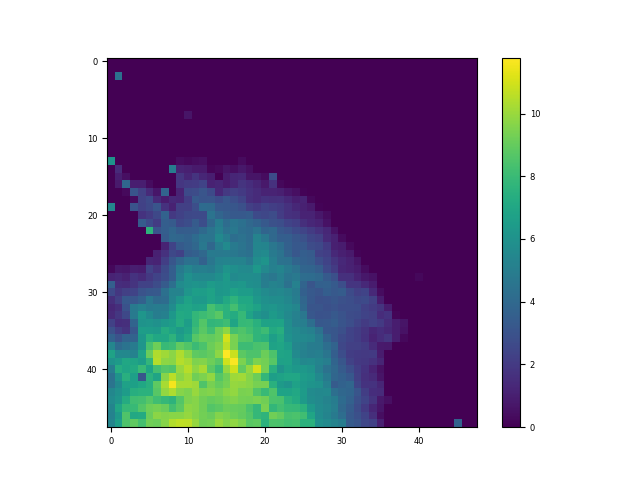

In [187]:
fig, ax = plt.subplots()
imshw = ax.imshow(pred_arr)
fig.colorbar(imshw)

In [163]:
new_fns[0].split('/')[-1].replace('.tiff', '.jpg')

'Sonar_2022-07-09_lake522_depth_pred.jpg'

In [173]:
new_fns

['sonar/img_depth_est/Sonar_2022-07-09_lake522_depth_pred.tiff',
 'sonar/img_depth_est/Sonar_2022-07-04_lake610a_depth_pred.tiff',
 'sonar/img_depth_est/Sonar_2022-07-09_lake610b_depth_pred.tiff']

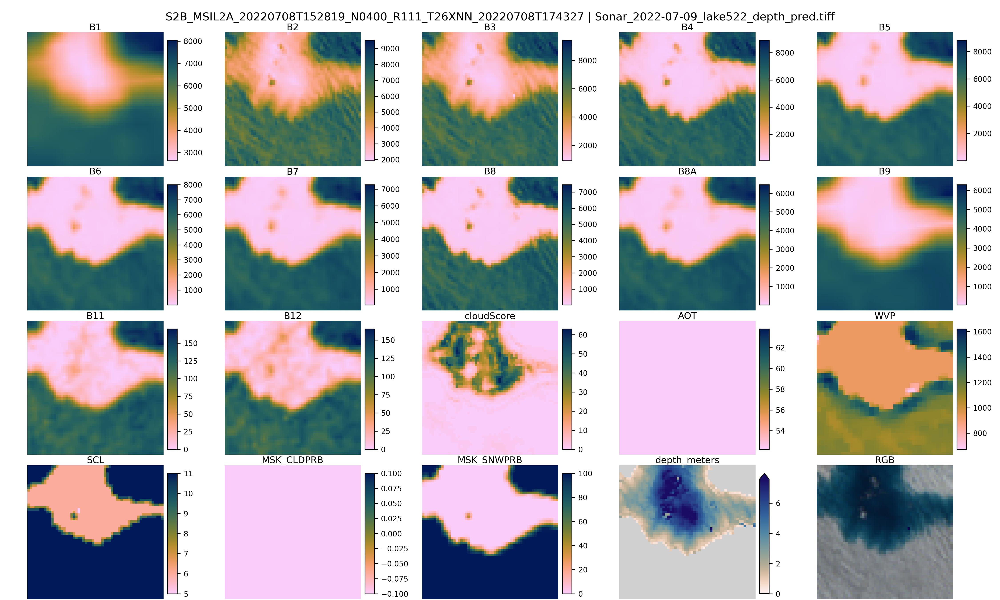

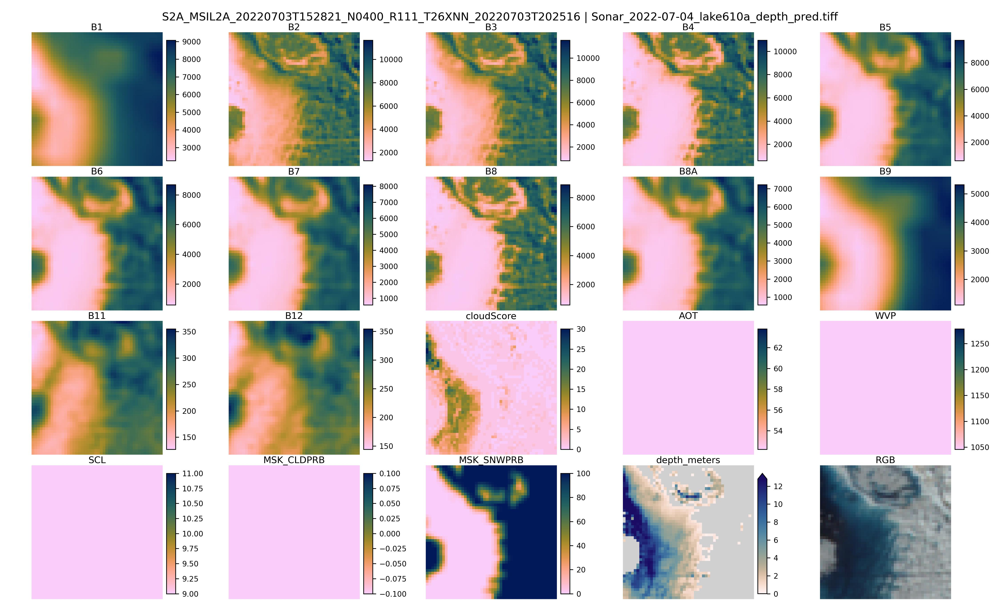

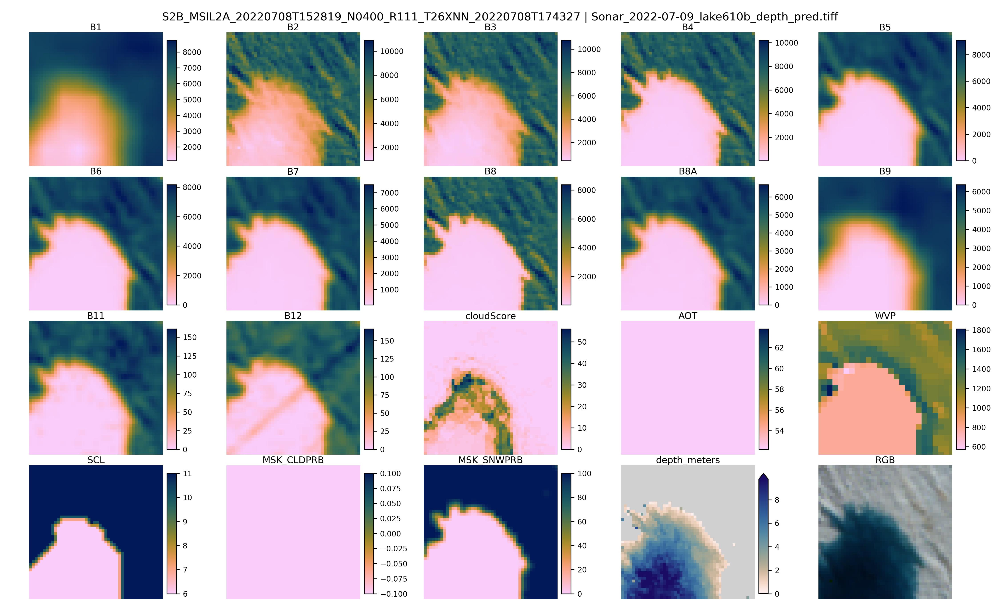

In [210]:
matplotlib.rcParams.update({'font.size': 8})
for fn_img in new_fns:
    fig, axs = plt.subplots(nrows=4, ncols=5, figsize=[15,9], dpi=55)
    axs = axs.flatten()
    img_dat = rio.open(fn_img)
    for i in range(img_dat.count):
        ax = axs[i]
        cmap = cmc.batlow_r if i<(img_dat.count-1) else cmc.lapaz_r
        data = img_dat.read(i+1)
        vmax = np.percentile(data, 98) if i == (img_dat.count - 1) else np.nanmax(data)
        extend = 'max' if i == (img_dat.count - 1) else 'neither'
        imgp = rioplot.show(data, ax=ax, cmap=cmap, vmax=vmax)
        txt = img_dat.tags(i+1)['band_name']
        ax.text(0.5, 1.0, txt, ha='center', va='bottom', transform=ax.transAxes, fontsize=10)
        cax = ax.inset_axes([1.03, 0.04, 0.07, 0.9])
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(vmin=np.nanmin(data), vmax=vmax))
        sm._A = []
        cbar = plt.colorbar(sm, cax=cax, orientation='vertical', extend=extend)
        # cbar.set_label('sonar water depth (m)')
        if i == (img_dat.count - 1):
            data_ = data
            data_[data_ > 0] = np.nan
            rioplot.show(data_, ax=ax, cmap=cmc.grayC, vmin=-1, vmax=5)
    for ax in axs:
        ax.axis('off')
    ax = axs[img_dat.count]
    fn_rgb = fn_img.replace('/img_depth_est/', '/data_lutz/').replace('_depth_pred.tiff','_imagery.tiff')
    img_rgb = rio.open(fn_rgb)
    rioplot.show(img_rgb, ax=ax)
    ax.text(0.5, 1.0, 'RGB', ha='center', va='bottom', transform=ax.transAxes, fontsize=10)

    fig.suptitle('%s | %s\n' % (img_dat.tags(0)['product_id'], fn_img.split('/')[-1]), fontsize=12)
    fig.tight_layout(pad=0.1, w_pad=0, h_pad=0.3)
    fn_plot_out = fn_img.split('/')[-1].replace('.tiff', '.jpg')
    fig.savefig(fn_plot_out, dpi=300)
    plt.close(fig)
    display(Image(fn_plot_out))

In [211]:
img_dat.count

19

In [ ]:
img_dat.tags(0)['product_id']

In [ ]:
rioplot.show(img_dat.read(17))

In [104]:
def get_features_image(df_data, out_id='example_image', verbose=False):
    df_in = df_data[['IS2_id', 'lat', 'lon', 'col', 'row', 'conf']].copy()
    for i, k in enumerate(list(df_data)[:-2]):
    
        # log transforms of bands
        if k.startswith('B') or (k=='AOT') or (k=='WVP') or (k=='cloudScore'):
            newname = k+'_log'
            if verbose:
                print('%s --> log: %s' % (k, newname))
            log_trans = np.log1p(df_data[k])
            df_in[newname] = log_trans
    
        # cosines of zenith angles
        if (k=='SZA') or k.startswith('VZA'):
            newname = k+'_cos'
            if verbose:
                print('%s --> cos: %s' % (k, newname))
            df_in[newname] = np.cos(np.deg2rad(df_data[k]))
            
        # the features that stay the same
        if k in ['SCL', 'MSK_CLDPRB', 'MSK_SNWPRB', 'ndwi']:
            if verbose:
                print('%s --> no change: %s' % (k, k))
            df_in[k] = df_data[k]
    
        # cosines of relative azimuth angles, and phase angles
        if k.startswith('VAA'):
            bnd = k[4:]
            newname = 'RAA_' + bnd + '_cos'
            if verbose:
                print('%s --> cos relative azimuth: %s' % (k, newname))
            RAA = np.cos(np.deg2rad(df_data[k] - df_data.SAA))
            df_in[newname] = RAA
            newname = 'PhA_' + bnd
            if verbose:
                print('%s --> phase angle: %s' % (k, newname))
            PhA = np.arccos(np.cos(np.deg2rad(df_data.SZA)) * np.cos(np.deg2rad(df_data['VZA_'+bnd])) + np.sin(np.deg2rad(df_data.SZA)) * np.sin(np.deg2rad(df_data['VZA_'+bnd])) * RAA)
            df_in[newname] = PhA
    
    # visible bands ratios and differences
    df_in['ratio_logB4_logB2'] = (df_in.B4_log+1.0) / (df_in.B2_log+1.0)
    df_in['ratio_logB4_logB3'] = (df_in.B4_log+1.0) / (df_in.B3_log+1.0)
    df_in['ratio_logB3_logB2'] = (df_in.B3_log+1.0) / (df_in.B2_log+1.0)
    df_in['diff_logB2_logB4'] = df_in.B2_log - df_in.B4_log
    df_in['diff_logB3_logB4'] = df_in.B3_log - df_in.B4_log
    df_in['diff_logB2_logB3'] = df_in.B2_log - df_in.B3_log
    
    fn_features = 'sonar/sonar_imagery_depth_features_%s.parquet' % (out_id)
    df_in.to_parquet(fn_features)
    print('--> wrote file: %s' % fn_features)
    return fn_features

def save_S2_bands_to_df(fn_img, out_id='example_image'):
    
    from rasterio.transform import Affine
    from pyproj import Transformer
    
    img_dat = rio.open(fn_img)
    
    # get the pixel center lon/lat values
    cols, rows = np.meshgrid(np.arange(img_dat.width), np.arange(img_dat.height))
    xs, ys = rio.transform.xy(img_dat.transform, rows, cols)
    xs = np.array(xs)
    ys = np.array(ys)
    transformer = Transformer.from_crs(img_dat.crs, "EPSG:4326", always_xy=True)
    lons, lats = transformer.transform(xs, ys)
    df_img = pd.DataFrame({'lon': lons.flatten(), 'lat': lats.flatten(), 'col': cols.flatten(), 'row': rows.flatten()})
    
    for ib in np.arange(1, img_dat.count+1):
        df_img[img_dat.tags(ib)['band_name']] = img_dat.read(int(ib)).flatten()
    
    print('--> get metadata from S3', end=' ')
    meta_fn_save = get_metadata_file(img_gt=None, l2a_product_id=img_dat.tags(0)['product_id'], l2a_granule_id=img_dat.tags(0)['granule_id'])
    
    print('--> interpolate angles', end=' ')
    gdf_img = add_interpolated_angles(meta_fn_save, df_img)
    
    product_id = img_dat.tags(0)['product_id']
    # fill nans if any
    if gdf_img.isna().any(axis=1).any():
        collection = ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
        yr = product_id[11:15]
        mn = product_id[15:17]
        dy = int(product_id[17:19])
        thisdate = ee.Date('%s-%s-%s' % (yr,mn,dy))
        thisImage = collection.filterDate(thisdate.advance(-1, 'day'), thisdate.advance(1, 'day')).filter(ee.Filter.eq('PRODUCT_ID', product_id)).first()
        gdf_img = fill_na_angles_with_means(gdf_img, thisImage)
    
    gdf_img['IS2_id'] = fn_img.split('/')[-1]
    gdf_img['S2_id'] = product_id
    gdf_img['ndwi'] = (gdf_img.B2 - gdf_img.B4) / (gdf_img.B2 + gdf_img.B4)
    gdf_img.loc[gdf_img.ndwi.isna(), 'ndwi'] = 1.0
    gdf_img['conf'] = gdf_img.isna().any(axis=1).astype(np.float32)
    
    colnames = ['lat', 'lon', 'col', 'row', 'conf',
                'B1', 'B2', 'B3', 'B4', 'B5', 'B6', 'B7', 'B8', 'B8A', 'B9', 'B11', 'B12', 
                'AOT', 'WVP', 'SCL', 'MSK_CLDPRB', 'MSK_SNWPRB', 'cloudScore', 'ndwi',
                'SZA', 'SAA',
                'VZA_B1', 'VZA_B2', 'VZA_B3', 'VZA_B4', 'VZA_B5', 'VZA_B6', 'VZA_B7', 'VZA_B8', 'VZA_B8A', 'VZA_B9', 'VZA_B11', 'VZA_B12',
                'VAA_B1', 'VAA_B2', 'VAA_B3', 'VAA_B4', 'VAA_B5', 'VAA_B6', 'VAA_B7', 'VAA_B8', 'VAA_B8A', 'VAA_B9', 'VAA_B11', 'VAA_B12',
                'S2_id', 'IS2_id']
    gdf_img = gdf_img[colnames]
    
    fn_out_data = 'sonar/S2_predictors/%s_depth_reflectance_S2.csv' % out_id
    import pyarrow as pa
    fn_out_data_pq = fn_out_data.replace('.csv', '.parquet')
    SCHEMA = pa.schema([
        ('lat', pa.float32()),
        ('lon', pa.float32()),
        ('col', pa.int32()),
        ('row', pa.int32()),
        ('conf', pa.float32()),
        ('B1', pa.float32()),
        ('B2', pa.float32()),
        ('B3', pa.float32()),
        ('B4', pa.float32()),
        ('B5', pa.float32()),
        ('B6', pa.float32()),
        ('B7', pa.float32()),
        ('B8', pa.float32()),
        ('B8A', pa.float32()),
        ('B9', pa.float32()),
        ('B11', pa.float32()),
        ('B12', pa.float32()),
        ('AOT', pa.float32()),
        ('WVP', pa.float32()),
        ('SCL', pa.uint8()),
        ('MSK_CLDPRB', pa.float32()),
        ('MSK_SNWPRB', pa.float32()),
        ('cloudScore', pa.float32()),
        ('ndwi', pa.float32()),
        ('SZA', pa.float32()),
        ('SAA', pa.float32()),
        ('VZA_B1', pa.float32()),
        ('VZA_B2', pa.float32()),
        ('VZA_B3', pa.float32()),
        ('VZA_B4', pa.float32()),
        ('VZA_B5', pa.float32()),
        ('VZA_B6', pa.float32()),
        ('VZA_B7', pa.float32()),
        ('VZA_B8', pa.float32()),
        ('VZA_B8A', pa.float32()),
        ('VZA_B9', pa.float32()),
        ('VZA_B11', pa.float32()),
        ('VZA_B12', pa.float32()),
        ('VAA_B1', pa.float32()),
        ('VAA_B2', pa.float32()),
        ('VAA_B3', pa.float32()),
        ('VAA_B4', pa.float32()),
        ('VAA_B5', pa.float32()),
        ('VAA_B6', pa.float32()),
        ('VAA_B7', pa.float32()),
        ('VAA_B8', pa.float32()),
        ('VAA_B8A', pa.float32()),
        ('VAA_B9', pa.float32()),
        ('VAA_B11', pa.float32()),
        ('VAA_B12', pa.float32()),
        ('S2_id', pa.string()),
        ('IS2_id', pa.string()),
    ])
    gdf_img.to_parquet(fn_out_data_pq, schema=SCHEMA)
    print('\n--> saved file as %s' % fn_out_data_pq)
    return fn_out_data_pq

--> get metadata from S3 
downloading S2_MTD/S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_20220708T174327_MTD_TL.xml
--> interpolate angles 
--> saved file as sonar/S2_predictors/Sonar_2022-07-09_lake522_imagery_full_info_depth_reflectance_S2.parquet


'sonar/S2_predictors/Sonar_2022-07-09_lake522_imagery_full_info_depth_reflectance_S2.parquet'

In [101]:
pd.read_parquet('sonar/S2_predictors/Sonar_2022-07-09_lake522_imagery_full_info_depth_reflectance_S2.parquet')


,lat,lon,col,row,conf,B1,B2,B3,B4,B5,...,VAA_B5,VAA_B6,VAA_B7,VAA_B8,VAA_B8A,VAA_B9,VAA_B11,VAA_B12,S2_id,IS2_id
0,78.925407,-21.829979,0,0,0.0,6540.0,7951.0,7818.0,7759.0,7709.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
1,78.925400,-21.829515,1,0,0.0,6467.0,7716.0,7580.0,7527.0,7866.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
2,78.925392,-21.829050,2,0,0.0,6392.0,7095.0,7233.0,7263.0,7502.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
3,78.925385,-21.828587,3,0,0.0,6315.0,6652.0,6568.0,6599.0,7175.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
4,78.925377,-21.828121,4,0,0.0,6236.0,6467.0,6440.0,6304.0,6887.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3187,78.920090,-21.808107,52,55,0.0,7143.0,7247.0,7220.0,7097.0,7053.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
3188,78.920082,-21.807642,53,55,0.0,7149.0,6923.0,6857.0,6581.0,7067.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
3189,78.920074,-21.807178,54,55,0.0,7135.0,6938.0,6554.0,6246.0,6984.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff
3190,78.920059,-21.806715,55,55,0.0,7121.0,7446.0,6990.0,6728.0,6962.0,...,302.983002,301.204987,299.447998,310.158997,297.755005,294.338989,301.332001,297.239014,S2B_MSIL2A_20220708T152819_N0400_R111_T26XNN_2...,Sonar_2022-07-09_lake522_imagery_full_info.tiff


In [77]:
fn_img.split('/')[-1].replace('.tiff', '')

'Sonar_2022-07-09_lake522_imagery_full_info'

In [ ]:

plt.close('all')


fns = {
    1: 'sonar/Sonar_2022-07-09_lake522.shp',
    2: 'sonar/Sonar_2022-07-04_lake610a.shp',
    3: 'sonar/Sonar_2022-07-09_lake610b.shp'
}

vmin = 0
vmax = 9

# buffers = {
#     1: 2,
#     2: 2,
#     3: 2
# }

buffers = {
    1: 1.2,
    2: 1.5,
    3: 1.5
}

gammas = {
    1: 1.2,
    2: 1.2,
    3: 1.2
}

clouds = {
    1: 50,
    2: 50,
    3: 50
}

crs_out = 'EPSG:3413'
tformat_in = '%Y-%m-%d %H:%M:%SZ'
tformat_out = '%Y-%m-%dT%H:%M:%SZ'
tformat_print = '%a, %-d %b %Y, %-I:%M %p'

# fig, axs = plt.subplots(figsize=[10,9], nrows=2, ncols=3)
# fig, axs = plt.subplots(figsize=[15,10], ncols=3, dpi=60)
fig = plt.figure(figsize=[15,5.8], dpi=60)
gs = fig.add_gridspec(ncols=3, nrows=1)
axs = [fig.add_subplot(gs[0,i]) for i in range(3)]

for iax, file in enumerate(fns.keys()):

    fn = fns[file]
    ax = axs[iax]
    gdf = gpd.read_file(fn)
    gdf['timestamp'] = gdf.apply(lambda x: datetime.timestamp(datetime.strptime(x.Time, tformat_in)), axis=1)
    bbox_gdf = gpd.GeoDataFrame(geometry=[box(*gdf.total_bounds)], crs=gdf.crs, index=[0])
    bbox_gre = bbox_gdf.to_crs(crs_out)
    lonlat = bbox_gdf.geometry.get_coordinates()
    xy = bbox_gre.geometry.get_coordinates()
    buff = buffers[file] * np.max((xy.x.max() - xy.x.min(), xy.y.max() - xy.y.min()))
    bboxbuff = bbox_gre.buffer(buff)
    fn_bbox = fn.replace('sonar/','sonar/bbox_shapefiles/').replace('.shp', '_bbox_buff_%.0f.shp' % buff)
    bboxbuff.to_file(fn_bbox)
    lon_center = lonlat.x.min() + (lonlat.x.max() - lonlat.x.min())/2
    lat_center = lonlat.y.min() + (lonlat.y.max() - lonlat.y.min())/2
    date_time = datetime.strftime(datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc), tformat_out)
    fn_imgry = fn.replace('.shp', '_imagery.tiff')
    print(lon_center, lat_center, date_time, buff)
    fn_imgprops = fn.replace('.shp', '_imgprops.csv')

    # download imagery if needed
    if re_download | (not (os.path.isfile(fn_imgry) and os.path.isfile(fn_imgprops))):
        imgprops = download_S2(lon_center, lat_center, date_time, buffer_m=buff, max_cloud_prob=clouds[file],
                           gamma_value=gammas[file], imagery_filename=fn_imgry, download_imagery=re_download)
        pd.Series(imgprops).to_csv(fn_imgprops, index=False)
    else:
        print('not downloading new imagery')
        imgprops = list(pd.read_csv(fn_imgprops)['0'])

    with rio.open(imgprops[0]) as myImage:
        rioplot.show(myImage, ax=ax)
        ax.axis('off')
        crs_img = myImage.crs
        
    gdf_img = gdf.to_crs(crs_img)
    add_graticule2(gdf=gdf_img, ax_img=ax, meridians_locs=['top'], parallels_locs=['left'], fontsz=6)
    gdf_plot = gdf_img.sort_values(by='Depth')
    gdf_plot[gdf_plot.Depth<0.2].plot(ax=ax, color='gray', markersize=7, edgecolors='none')
    gdf_plot[gdf_plot.Depth>=0.2].plot(ax=ax, column='Depth', cmap=cmc.hawaii, markersize=7, edgecolors='none', vmin=vmin, vmax=vmax)
    gdf_plot.plot(ax=ax, color='k', markersize=0.2, edgecolors='none')
    # sm = plt.cm.ScalarMappable(cmap=cmc.hawaii, norm=plt.Normalize(vmin=vmin, vmax=vmax))
    # sm._A = []
    # divider = make_axes_locatable(ax)
    # cax = divider.append_axes('right', size='3%', pad=0.05)
    # cbar = fig.colorbar(sm, cax=cax, orientation='vertical')
    # cbar.set_label('sonar water depth (m)')
    
    lake_id = fn.split('_')[-1].replace('.shp','').replace('lake', 'lake ')
    datetime_plot = datetime.strftime(datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc), tformat_print)
    datetime_print_s2 = datetime.strftime(datetime.strptime(imgprops[1],tformat_out), tformat_print)
    lon_str = '%.4f°%s' % (np.abs(lon_center), 'W' if lon_center < 0 else 'E')
    lat_str = '%.4f°%s' % (np.abs(lat_center), 'S' if lon_center < 0 else 'N')

    # get the proper time difference
    t_s2 = datetime.strptime(imgprops[1], tformat_out).replace(tzinfo=timezone.utc)
    t_sonar = datetime.fromtimestamp(gdf.timestamp.median(), tz=timezone.utc)
    tdiff = t_s2 - t_sonar
    tsec = tdiff.total_seconds()
    sign = 'before' if np.sign(tsec) < 0 else 'after'
    tsec = np.abs(tsec) 
    days, rem = divmod(tsec, 24 * 60 * 60)
    hrs, rem = divmod(rem, 60 * 60)
    mins, secs = divmod(rem, 60)
    days = '' if days == 0 else '%i days, ' % days
    hrs = '' if hrs == 0 else '%i hrs, ' % hrs
    mins = '%i mins' % mins
    tdiff_str = 'imagery %s%s%s %s sonar' % (days,hrs,mins,sign)
    
    txt = '%s, %s | %s UTC' % (lat_str, lon_str, datetime_plot)
    tbbox = dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1.7)
    tbx = ax.text(0.5, 0.92, lake_id, transform=ax.transAxes, ha='center', va='bottom',fontsize=14)
    tbx.set_bbox(tbbox)
    tbx = ax.text(0.5, 0.9, txt, transform=ax.transAxes, ha='center', va='top',fontsize=8)
    tbx.set_bbox(tbbox)
    
    ## add some info about the Sentinel-2 image
    txt = 'sonar data: Katrina Lutz et al.'
    txt += '\nimagery: Sentinel-2, %s UTC\n' % datetime_print_s2
    txt += '- %s\n' % imgprops[4]
    txt += '- mean cloud probability: %.1f%%\n' % float(imgprops[3])
    txt += 'time difference: %s' % tdiff_str
    tbx = ax.text(0.01, 0.01, txt, transform=ax.transAxes, ha='left', va='bottom',fontsize=5)
    tbbox = dict(facecolor='white', alpha=0.5, edgecolor='none', pad=0.5)
    tbx.set_bbox(tbbox)

    print('\n%s' % lake_id)
    print('location: %.5f, %.5f' % (lon_center, lat_center))
    print('time:', datetime_plot)
    print('n_obs', len(gdf_plot[gdf_plot.Depth>0]))
    print('depth_max', gdf_plot.Depth.max())
    print('depth_min', gdf_plot.Depth.min())
    print('depth_min_nonzero %.2f\n' % gdf_plot[gdf_plot.Depth>0].Depth.min())

ax_full = fig.add_subplot(gs[0,:])
ax_full.axis('off')
cax = ax_full.inset_axes([0, 0.06, 1, 0.025])
sm = plt.cm.ScalarMappable(cmap=cmc.hawaii, norm=plt.Normalize(vmin=vmin, vmax=vmax))
sm._A = []
cbar = plt.colorbar(sm, cax=cax, orientation='horizontal')
cbar.set_label('sonar water depth (m)')
# cbar.set_label('photon signal\nconfidence', fontsize=8, labelpad=1.5)
# cax.tick_params(axis='both', which='major', labelsize=7)

# axs[-1].axis('off')
fig.tight_layout()
figname = 'supraglacial_lakes_sonar_depth_GrIS_NE.jpg'
fig.savefig(figname, dpi=600)
plt.close(fig)
display(Image(figname))